In [1]:
import qiskit
from Steane import SteaneEncoder,SteaneSyndromeDetector,SteaneSyndromeCorrector,SteaneErrorCorrector,SteaneFaultTolerantGates,SteaneFaultTolerantEncoder
from qiskit.circuit.library import HGate,XGate,SGate,CXGate

In [2]:
e = SteaneFaultTolerantEncoder(2)
#e = SteaneEncoder()
dag = e.createEncoderDag(2)
#dag.draw("mpl")

In [3]:
ftg = SteaneFaultTolerantGates()
qregs = [dag.qregs[qreg] for qreg in dag.qregs]
dag = ftg.addGateDag(dag, HGate(), [qregs[:1]])
dag = ftg.addGateDag(dag, XGate(), [qregs[:1]])
dag = ftg.addGateDag(dag, SGate(), [qregs[:1]])
dag = ftg.addGateDag(dag, CXGate(), [qregs[:1],qregs[1:]])
#dag.draw()

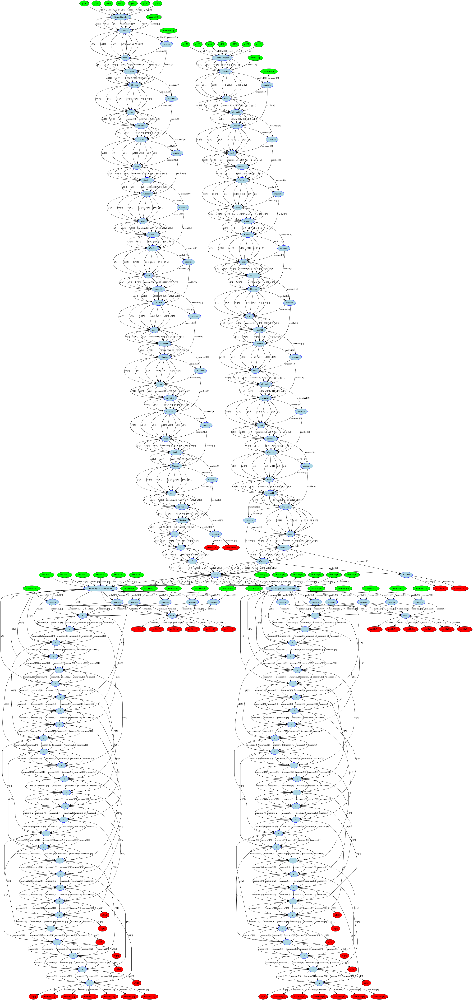

In [4]:
se = SteaneErrorCorrector()
qregs = [dag.qregs[qreg] for qreg in dag.qregs]
dag = se.errorCorrectDag(dag,qregs[:2])
dag.draw()

In [5]:
from qiskit.converters import circuit_to_dag, dag_to_circuit
dag2 = circuit_to_dag(dag_to_circuit(dag).decompose().decompose())
dag2.draw()

In [6]:
from qiskit import Aer,transpile
from qiskit.compiler import assemble
from qiskit.visualization import plot_histogram

simulator = Aer.get_backend('qasm_simulator')
circuit2 = transpile(circuit, simulator)
qobj = assemble(circuit2)

result = simulator.run(qobj).result()
plot_histogram(result.get_counts(), title='Counts')

NameError: name 'circuit' is not defined

In [ ]:
circuit = se.errorCorrectCircuit(circuit,circuit.qregs[:1],circuit.cregs,circuit.qregs[1:])
#circuit.draw("mpl")

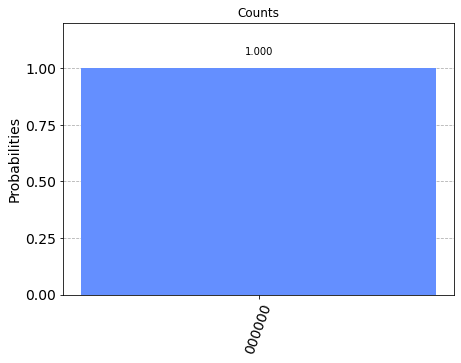

In [77]:
circuit2 = transpile(circuit, simulator)
qobj = assemble(circuit2)

result = simulator.run(qobj).result()
plot_histogram(result.get_counts(), title='Counts')